In [36]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import astropy
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.colors import SymLogNorm, LogNorm
from astropy import units as u
import os
from lxml import etree
%matplotlib inline

In [3]:
def plot_skymap(file, name='skymap.png', title=None, xlabel='right ascension (deg)', 
                     ylabel='declination (deg)', figsize=(10, 10), fontsize=20, cmap='gist_heat'):
    # get map
    fig = plt.figure(figsize=figsize) 
    ax = plt.subplot(projection=wcs)
    img = plt.imshow(skymap, norm=SymLogNorm(1), interpolation='gaussian', cmap=cmap)
    ax.coords[0].set_format_unit(u.deg) 
    ax.coords[1].set_format_unit(u.deg)
    cb = plt.colorbar(img, ax=ax)
    # axis
    ax.tick_params(axis='both', labelsize=fontsize)
    cb.ax.tick_params(labelsize=fontsize) 
    cb.set_label('counts', fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.set_title(title, fontsize=fontsize)
    ax.grid(color='grey', ls='solid')
    fig.tight_layout()
    return 



In [49]:
#dataset upload
data_folder = os.path.join("..", "data")
xml_folder = os.path.join("..","models")
dataset = []
i=0
bkg=0
single=0
double=0

#Order by name bkg-oneSource-twoSource
directory=os.listdir(data_folder)
directory.sort()

for dir_skymap in directory:
    if(os.path.isdir(os.path.join(data_folder, dir_skymap))):        
        for crab_skymap in os.listdir(os.path.join(data_folder, dir_skymap)):
            if(dir_skymap == "backgroundSimulations"):
                bkg+=1
                i+=1
                with fits.open((os.path.join(data_folder, dir_skymap, crab_skymap))) as hdul:
                    wcs = WCS(hdul[0].header)
                    dataset.append((hdul[0].data,wcs,crab_skymap,"None"))  
            else:
                with fits.open((os.path.join(data_folder, dir_skymap, crab_skymap))) as hdul:
                    wcs = WCS(hdul[0].header)
                    dataset.append((hdul[0].data,wcs,crab_skymap))
                    
directory=os.listdir(xml_folder)
directory.sort()

for xml_subfolder in directory:
    if(xml_subfolder == "sourceModels"):
        for xml_file in os.listdir(os.path.join(xml_folder, xml_subfolder)):
            tree = etree.parse((os.path.join(xml_folder, xml_subfolder, xml_file)))
            root = tree.getroot()
            Ra = float(root[0][1][0].get("value"))
            Dec = float(root[0][1][1].get("value"))
            dataset[i] +=((Ra,Dec),)
            i+=1
            single+=1
    if(xml_subfolder == "twoSourcesModels"):
        for xml_file in os.listdir(os.path.join(xml_folder, xml_subfolder)):
            tree = etree.parse((os.path.join(xml_folder, xml_subfolder, xml_file)))
            root = tree.getroot()
            Ra = float(root[0][1][0].get("value"))
            Dec = float(root[0][1][1].get("value"))
            Ra2 = float(root[1][1][0].get("value"))
            Dec2 = float(root[1][1][1].get("value"))
            dataset[i] +=(((Ra,Dec),(Ra2,Dec2)),)
            i+=1
            double+=1
            
#print(dataset)
print("number of total entries: ",i)
print("numebr of entries of single source: ",single)
print("number of backgrounds: ",bkg)
print("number of entries of double sources: ",double)   

number of total entries:  20
numebr of entries of single source:  10
number of backgrounds:  5
number of entries of double sources:  5


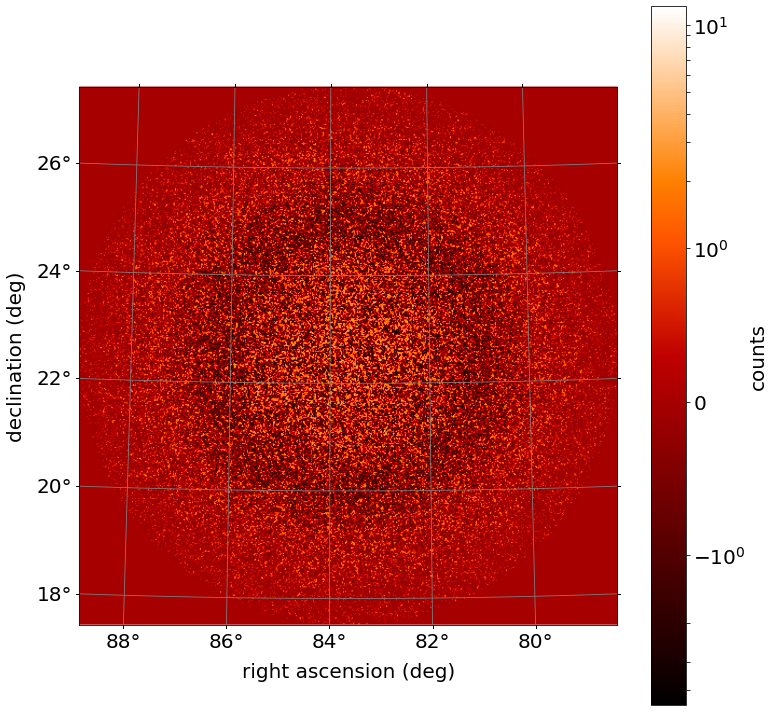

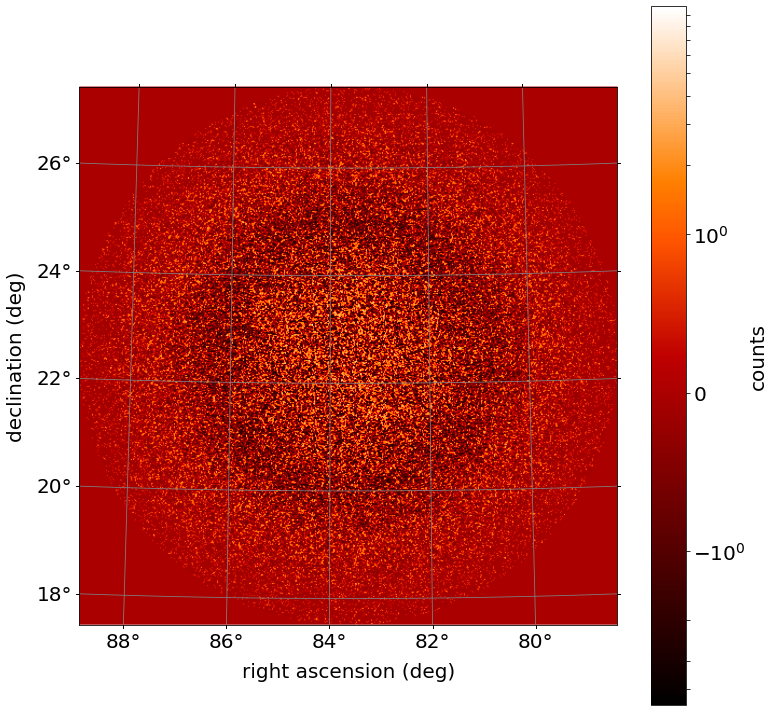

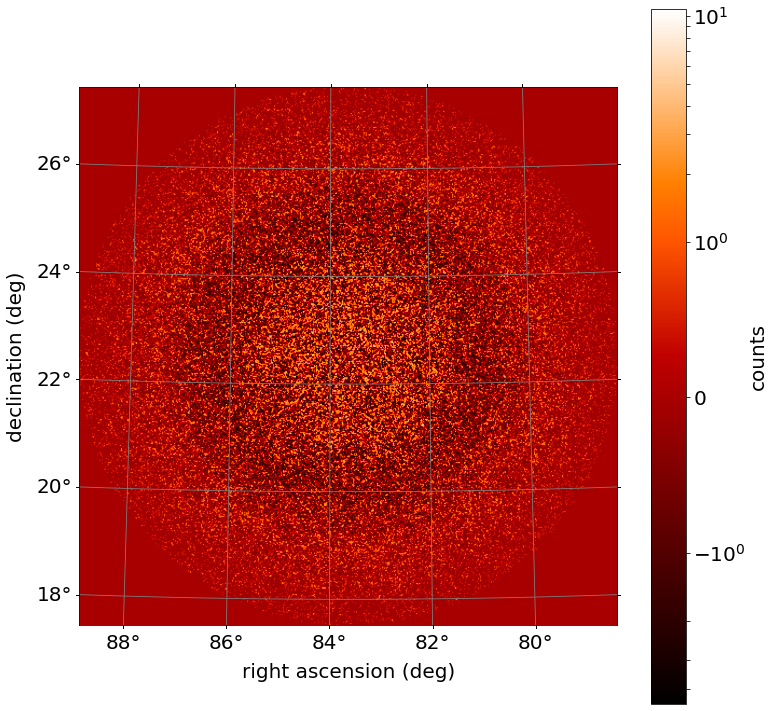

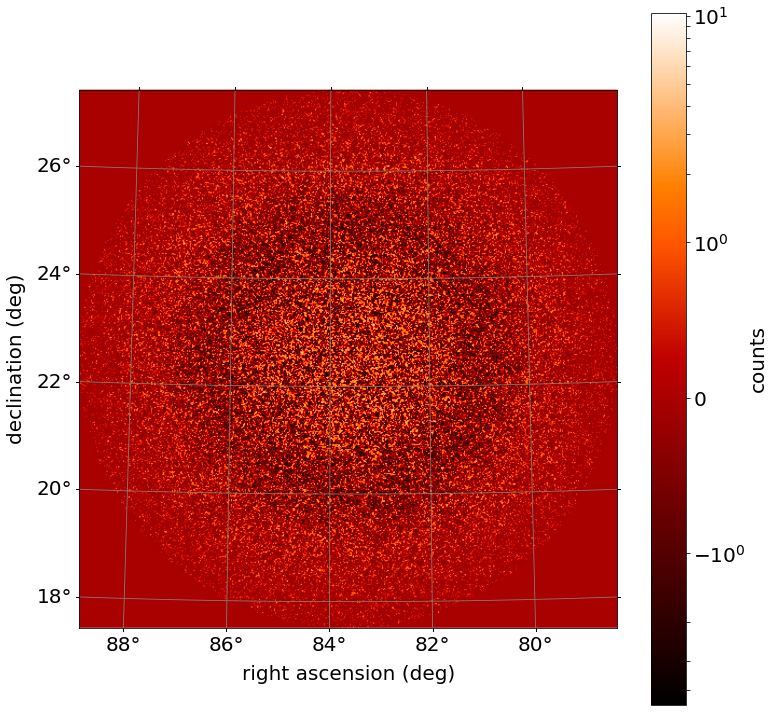

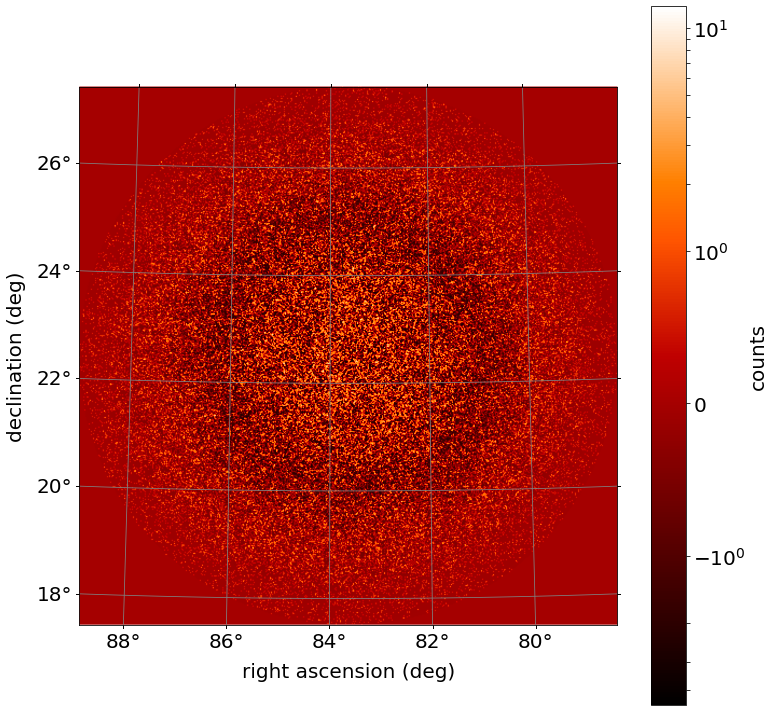

...

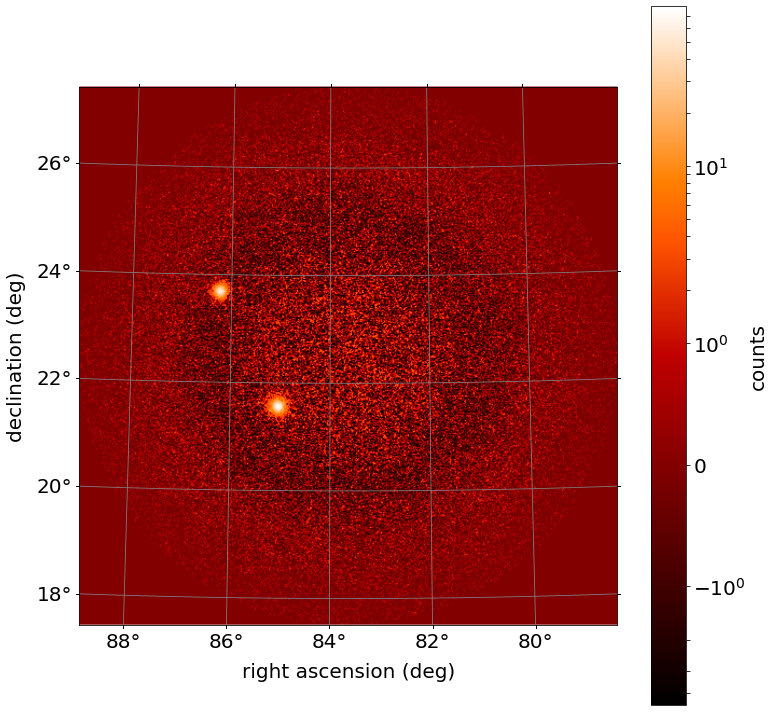

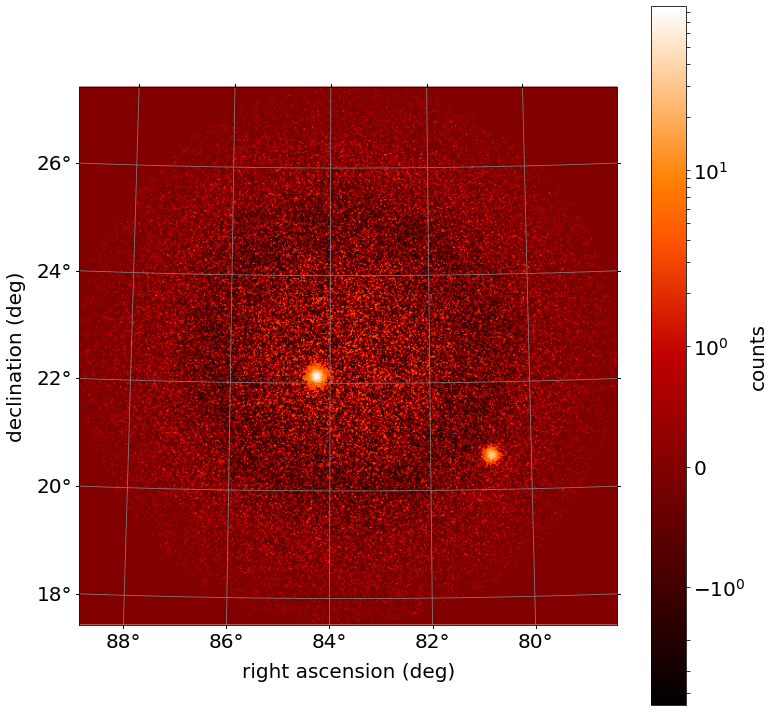

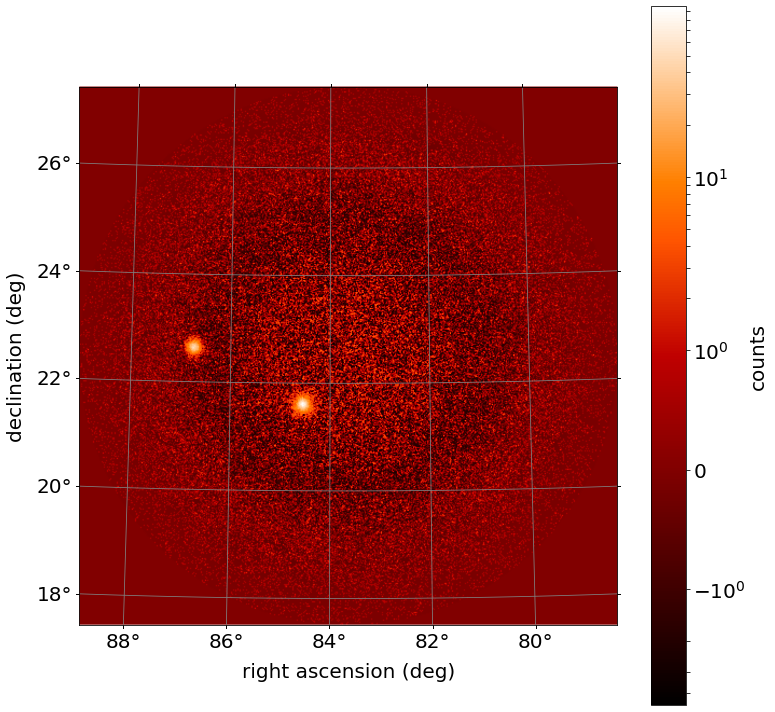

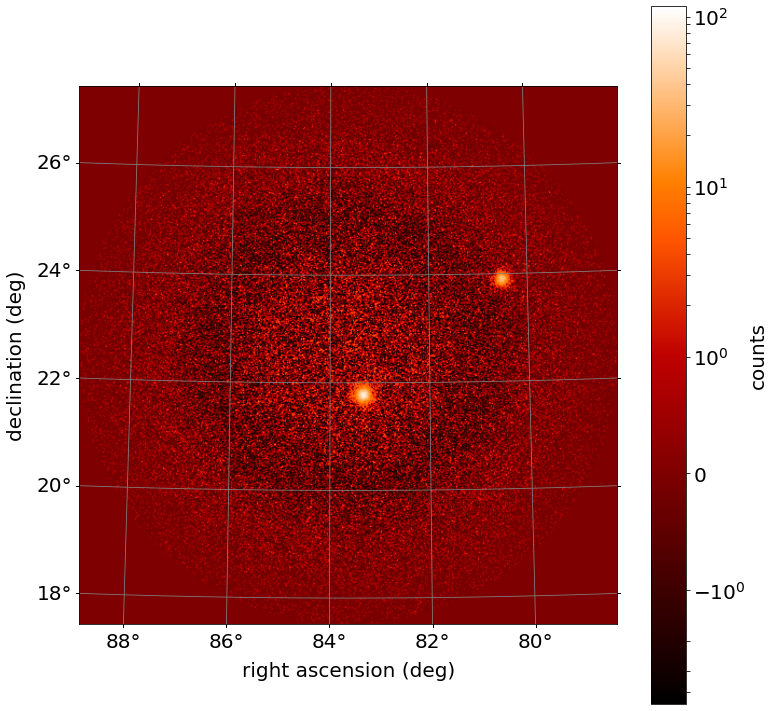

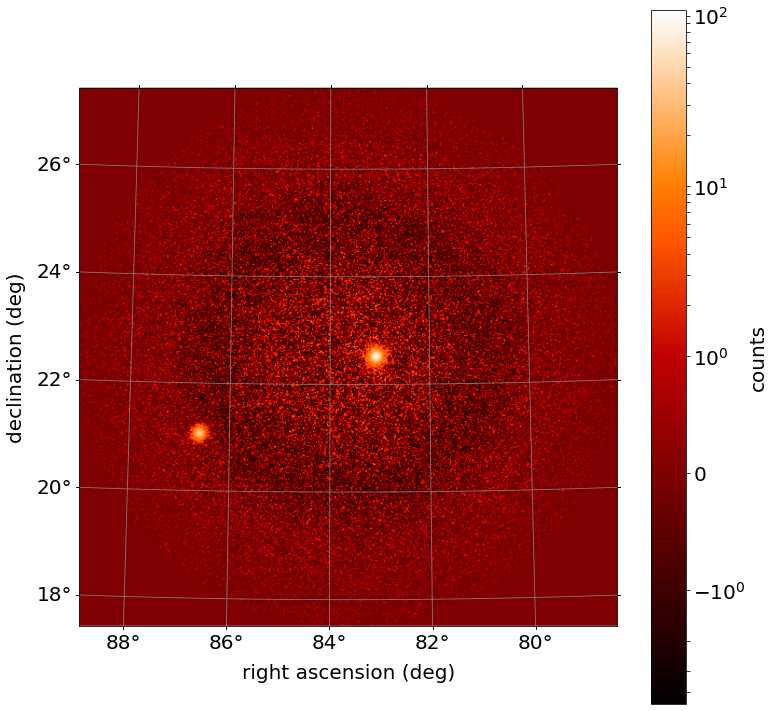

In [60]:
for skymap,wcs,name,source_position in dataset:
    plot_skymap(skymap)

In [62]:
dataset[17][3]

((84.5427, 21.6066), (86.7354, 22.6433))

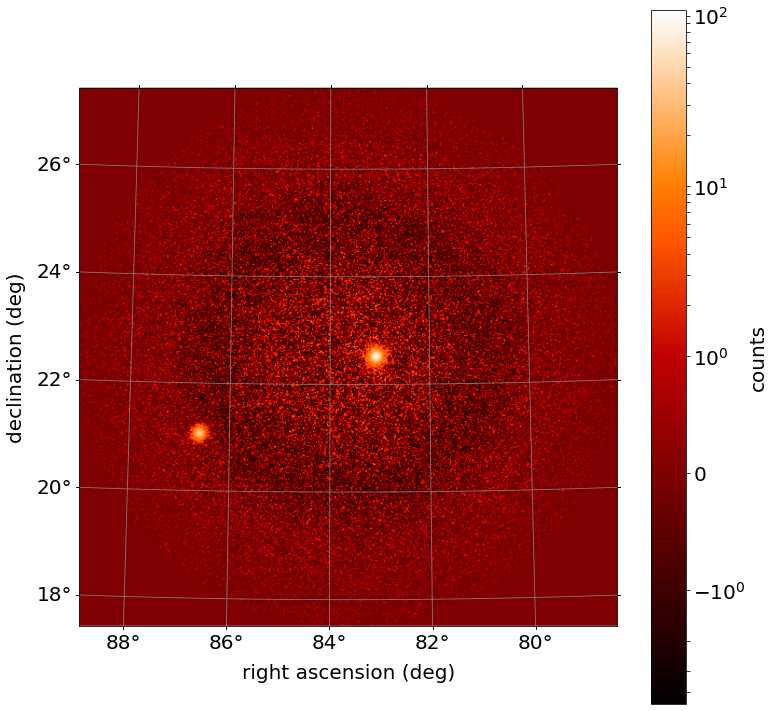

In [61]:
plot_skymap(dataset[17][0])

group3_sky_3.fits
<SkyCoord (ICRS): (ra, dec) in deg
    (80.5208, 23.8899)>
391.8140749025323 319.7498136191495


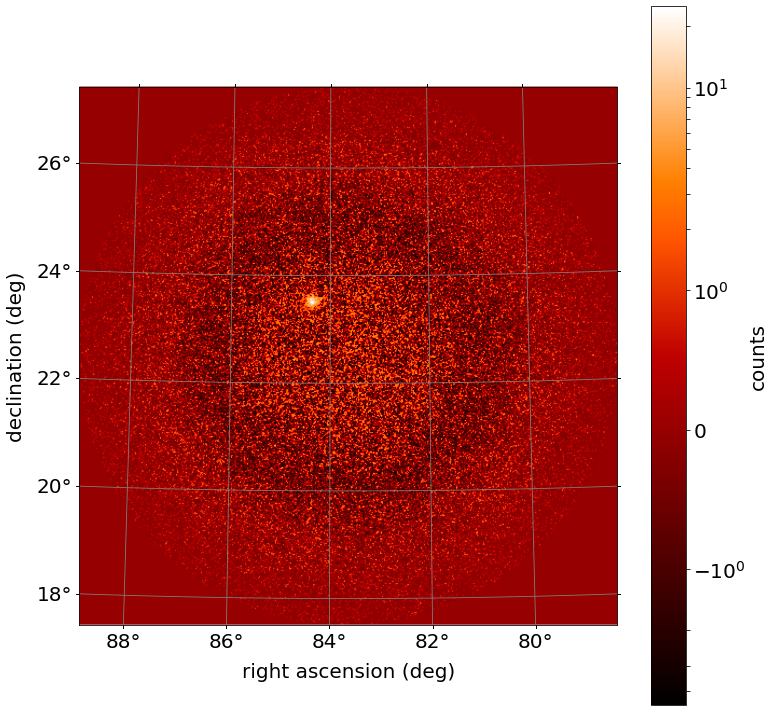

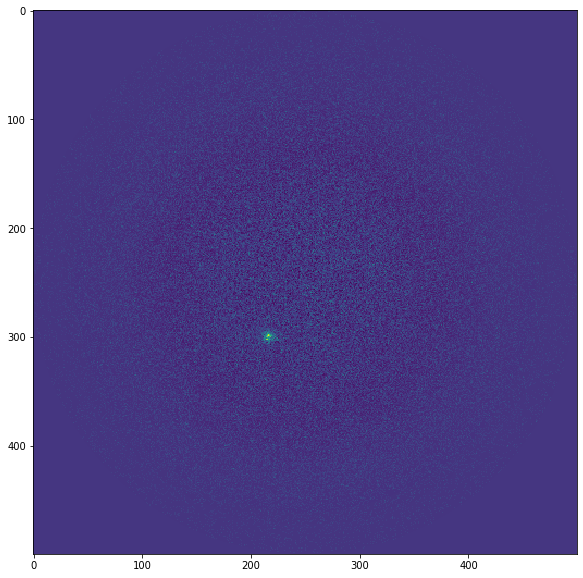

In [52]:
skymap = np.copy(dataset[8][0])
ra,deg = dataset[8][3]
print(dataset[8][2])
coordinates = astropy.coordinates.SkyCoord(ra,deg,unit='deg')
px,py = dataset[8][1].world_to_pixel(coordinates)
print(coordinates)
print(px,py)
plot_skymap(skymap)
plt.figure(figsize=(10,10))
plt.imshow(skymap)
plt.show()

In [ ]:
for skymap,wcs,name,source_position in dataset:
    skymap[skymap < 0] = 0
    skymap = skymap.astype("uint8")
    histogram = cv2.calcHist([skymap],[0],None,[np.max(skymap)],[0,np.max(skymap)])
    plt.plot(histogram)

In [7]:
#filtering negative values (the number of photons hitting the sensor is alwais positive)


In [1]:

rmin = np.min(skymap)
rmax = np.max(skymap)

skymap = (skymap-rmin)*255/(rmax-rmin).astype('uint8')

NameError: name 'np' is not defined

In [23]:
rmin = np.min(skymap)
rmax = np.max(skymap)
print(rmin,rmax)

-4.664260010275239 10.734301275531411


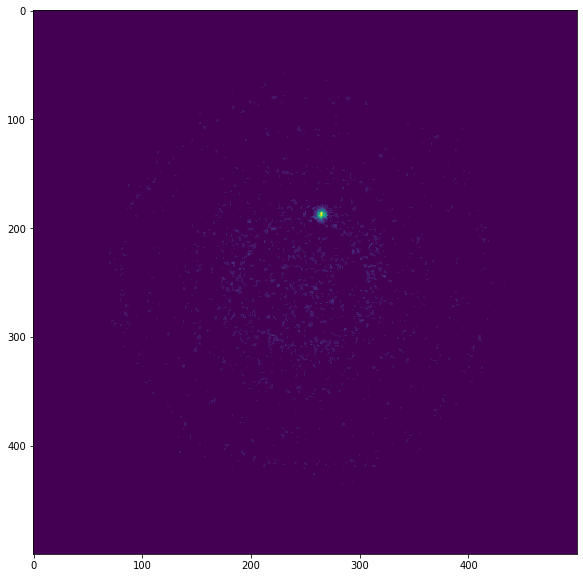

In [16]:
#filtering
threshold = 100
for threshold in range(0,5,1):
    binary_skymap = np.copy(skymap)
    binary_skymap[skymap <= threshold] = 255
    binary_skymap[skymap > threshold] = 0

    #filtering by any means
    skymap_filtered = cv2.medianBlur(skymap, 3)

    plt.figure(figsize=(10,10))
    plt.imshow(skymap_filtered)
    plt.show()


In [32]:
#source acquisition

skymap = dataset[1][0]

gamma_ray_coordinates = np.unravel_index(np.argmax(skymap), skymap.shape)

print(gamma_ray_coordinates)

px,py = gamma_ray_coordinates

sky = dataset[1][1].pixel_to_world(px,py)
print(sky)  

(278, 216)
<SkyCoord (ICRS): (ra, dec) in deg
    (83.01905169, 21.84333043)>


In [ ]:
#validity check
#if the source found match within a limit 